# Proyek Analisis Data: Bike Sharing Dataset

- Nama: Yandi Hermawan
- E-mail: iyaand333@gmail.com
- IdDicoding: -

# Menentukan Pertanyaan Bisnis

1. kapan kebanyakan user menggunakan user bike sharing?
2. faktor apa saja yang meningkatkan penggunaan bike sharing?

# Menyaipkan semua library yang dibuthkan

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style()
from scipy import stats

In [2]:
def adjust(h=5):
    plt.figure(figsize=(16, h), dpi=300)

# Data Wrangling

## Gathering Data

### hour

In [3]:
hour = pd.read_csv('hour.csv')
hour.head()

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0,3,13,16
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0,8,32,40
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0,5,27,32
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0,3,10,13
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0,0,1,1


### day

In [4]:
day = pd.read_csv('day.csv')
day.head()

,instant,dteday,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,6,0,2,0.344167,0.363625,0.805833,0.160446,331,654,985
1,2,2011-01-02,1,0,1,0,0,0,2,0.363478,0.353739,0.696087,0.248539,131,670,801
2,3,2011-01-03,1,0,1,0,1,1,1,0.196364,0.189405,0.437273,0.248309,120,1229,1349
3,4,2011-01-04,1,0,1,0,2,1,1,0.200000,0.212122,0.590435,0.160296,108,1454,1562
4,5,2011-01-05,1,0,1,0,3,1,1,0.226957,0.229270,0.436957,0.186900,82,1518,1600


## Assessing Data

### hour

In [5]:
hour.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 17 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   instant     17379 non-null  int64  
 1   dteday      17379 non-null  object 
 2   season      17379 non-null  int64  
 3   yr          17379 non-null  int64  
 4   mnth        17379 non-null  int64  
 5   hr          17379 non-null  int64  
 6   holiday     17379 non-null  int64  
 7   weekday     17379 non-null  int64  
 8   workingday  17379 non-null  int64  
 9   weathersit  17379 non-null  int64  
 10  temp        17379 non-null  float64
 11  atemp       17379 non-null  float64
 12  hum         17379 non-null  float64
 13  windspeed   17379 non-null  float64
 14  casual      17379 non-null  int64  
 15  registered  17379 non-null  int64  
 16  cnt         17379 non-null  int64  
dtypes: float64(4), int64(12), object(1)
memory usage: 2.3+ MB


In [6]:
hour.isna().sum()

instant       0
dteday        0
season        0
yr            0
mnth          0
hr            0
holiday       0
weekday       0
workingday    0
weathersit    0
temp          0
atemp         0
hum           0
windspeed     0
casual        0
registered    0
cnt           0
dtype: int64

### day

In [7]:
day.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 731 entries, 0 to 730
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   instant     731 non-null    int64  
 1   dteday      731 non-null    object 
 2   season      731 non-null    int64  
 3   yr          731 non-null    int64  
 4   mnth        731 non-null    int64  
 5   holiday     731 non-null    int64  
 6   weekday     731 non-null    int64  
 7   workingday  731 non-null    int64  
 8   weathersit  731 non-null    int64  
 9   temp        731 non-null    float64
 10  atemp       731 non-null    float64
 11  hum         731 non-null    float64
 12  windspeed   731 non-null    float64
 13  casual      731 non-null    int64  
 14  registered  731 non-null    int64  
 15  cnt         731 non-null    int64  
dtypes: float64(4), int64(11), object(1)
memory usage: 91.5+ KB


In [8]:
day.isna().sum()

instant       0
dteday        0
season        0
yr            0
mnth          0
holiday       0
weekday       0
workingday    0
weathersit    0
temp          0
atemp         0
hum           0
windspeed     0
casual        0
registered    0
cnt           0
dtype: int64

In [9]:
print(f"total duplicated file for day dataset {day.duplicated().sum()}")
print(f"total duplicated file for hour dataset {hour.duplicated().sum()}")


total duplicated file for day dataset 0
total duplicated file for hour dataset 0


I believe that columns yr, mnth, hr, holiday, weekday, workingday, and weathersit are supposed to be categorical from dataset hour and day.
for dataset hour, I think I do not need column dteday because there are same date and it will not be good to be the index.

## Cleaning Data

### hour

In [10]:
# I change cnt into y because the target is cnt and I am commitment to change target into y
columns = {'dteday': 'date',
           'yr': 'year',
           'mnth': 'month',
           'hr': 'hour',
           'cnt': 'y'}

In [11]:
hour = hour.rename(columns=columns)
hour = hour.drop(['instant', 'date'], axis=1)
hour.tail()

,season,year,month,hour,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,y
17374,1,1,12,19,0,1,1,2,0.26,0.2576,0.60,0.1642,11,108,119
17375,1,1,12,20,0,1,1,2,0.26,0.2576,0.60,0.1642,8,81,89
17376,1,1,12,21,0,1,1,1,0.26,0.2576,0.60,0.1642,7,83,90
17377,1,1,12,22,0,1,1,1,0.26,0.2727,0.56,0.1343,13,48,61
17378,1,1,12,23,0,1,1,1,0.26,0.2727,0.65,0.1343,12,37,49


In [12]:
cols = ['season', 'year', 'month', 'holiday', 'weekday', 'workingday', 'weathersit']
for col in cols:
    hour[col] = hour[col].astype('category')
hour['hour'] = hour['hour'].astype('category')
hour.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 15 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   season      17379 non-null  category
 1   year        17379 non-null  category
 2   month       17379 non-null  category
 3   hour        17379 non-null  category
 4   holiday     17379 non-null  category
 5   weekday     17379 non-null  category
 6   workingday  17379 non-null  category
 7   weathersit  17379 non-null  category
 8   temp        17379 non-null  float64 
 9   atemp       17379 non-null  float64 
 10  hum         17379 non-null  float64 
 11  windspeed   17379 non-null  float64 
 12  casual      17379 non-null  int64   
 13  registered  17379 non-null  int64   
 14  y           17379 non-null  int64   
dtypes: category(8), float64(4), int64(3)
memory usage: 1.1 MB


### day

In [13]:
day = day.rename(columns=columns)
day['date'] = pd.to_datetime(day['date'], yearfirst=True)
day.index = day['date']
day = day.drop(['instant', 'date'], axis=1)
day.tail()

,season,year,month,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,y
date,,,,,,,,,,,,,,
2012-12-27,1,1,12,0,4,1,2,0.254167,0.226642,0.652917,0.350133,247,1867,2114
2012-12-28,1,1,12,0,5,1,2,0.253333,0.255046,0.590000,0.155471,644,2451,3095
2012-12-29,1,1,12,0,6,0,2,0.253333,0.242400,0.752917,0.124383,159,1182,1341
2012-12-30,1,1,12,0,0,0,1,0.255833,0.231700,0.483333,0.350754,364,1432,1796
2012-12-31,1,1,12,0,1,1,2,0.215833,0.223487,0.577500,0.154846,439,2290,2729


In [14]:
for col in cols:
    day[col] = day[col].astype('category')
day.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 731 entries, 2011-01-01 to 2012-12-31
Data columns (total 14 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   season      731 non-null    category
 1   year        731 non-null    category
 2   month       731 non-null    category
 3   holiday     731 non-null    category
 4   weekday     731 non-null    category
 5   workingday  731 non-null    category
 6   weathersit  731 non-null    category
 7   temp        731 non-null    float64 
 8   atemp       731 non-null    float64 
 9   hum         731 non-null    float64 
 10  windspeed   731 non-null    float64 
 11  casual      731 non-null    int64   
 12  registered  731 non-null    int64   
 13  y           731 non-null    int64   
dtypes: category(7), float64(4), int64(3)
memory usage: 52.1 KB


In my opinion, based on two datasets above. Day dataset fits better for time-series case.

# Exploratory Data Analysis (EDA)

### Explore ...

because I have not learned time-series yet, so I start explore time series dataset first. still limited knowledge to analyze time-series problem.

### day

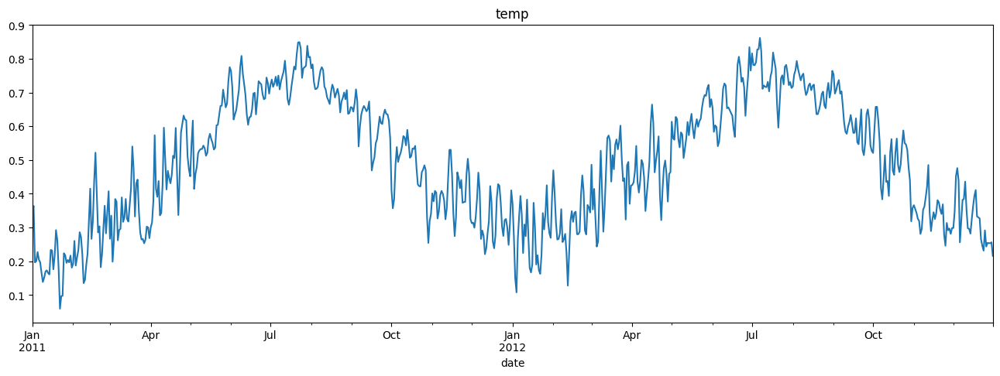

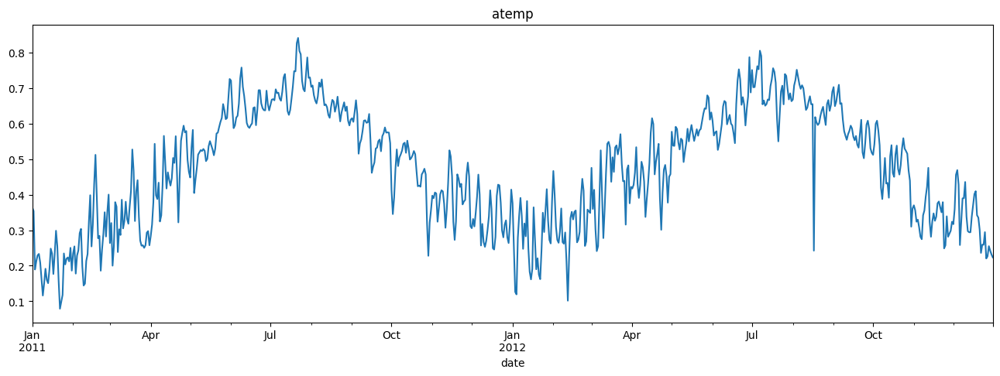

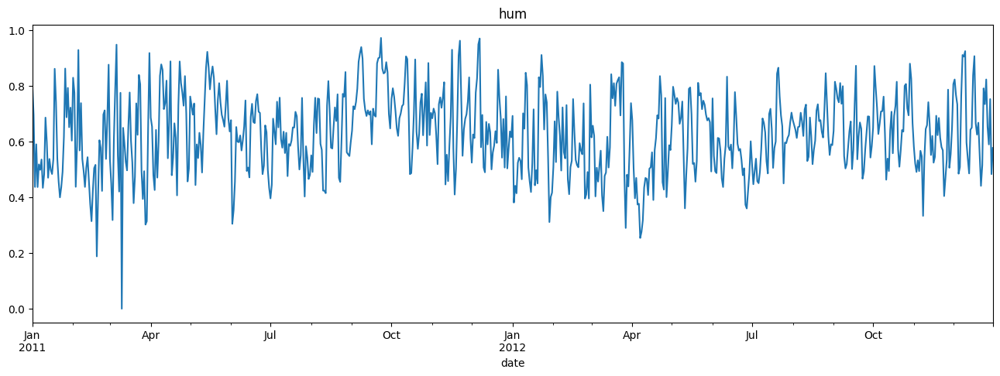

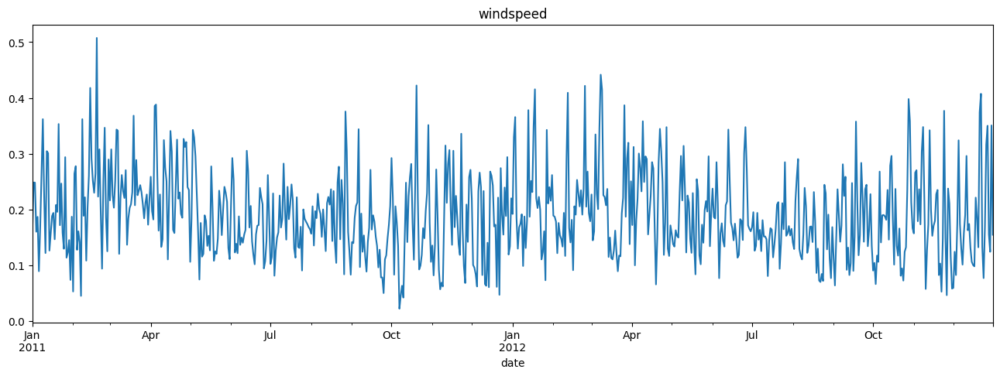

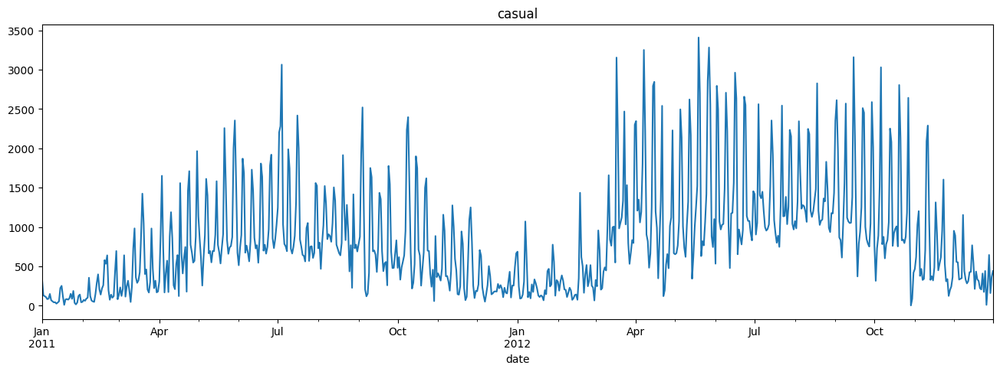

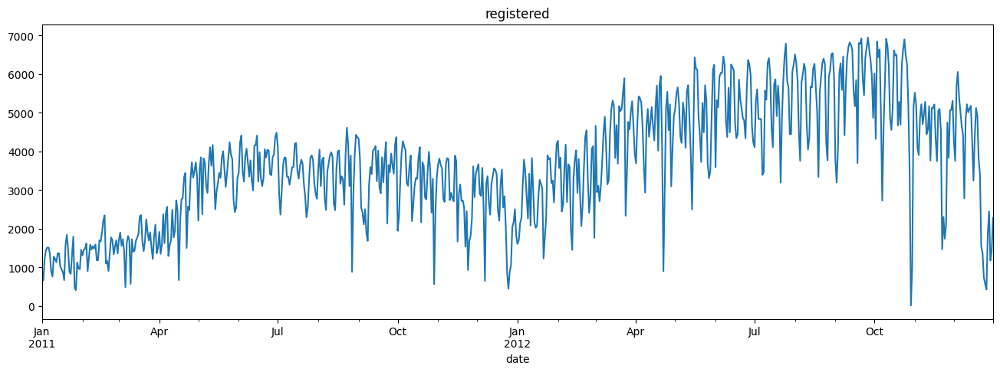

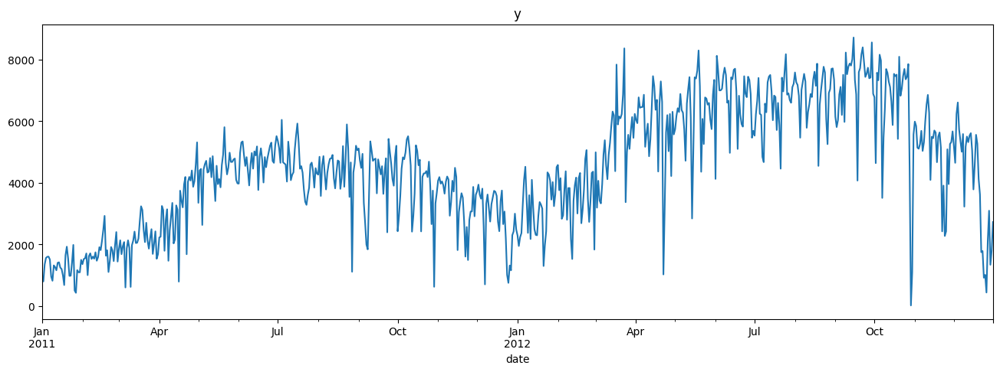

In [15]:
# I choose from column 8 because column 1-7 is categorical
cols = day.keys()[7:]

for c in cols:
    day[c].plot(figsize=(16,5))
    plt.title(c)
    plt.show()

findings:

- trends for temp and atemt look similar. next step is to see through correlation. if more than 90%, one variable can explain another variable.
- in 2011 and 2012, july and september are the highest value from temp and atemp. the trend of casual users looks similar to temp and atemp. need to check correlation as well.
- in count of users, it looks like from october 2012 to the end of 2012 is decreasing. explanation is a must.

### hour

#### numeric

In [16]:
numberic = hour.describe().round(3)
numberic

,temp,atemp,hum,windspeed,casual,registered,y
count,17379.000,17379.000,17379.000,17379.000,17379.000,17379.000,17379.000
mean,0.497,0.476,0.627,0.190,35.676,153.787,189.463
std,0.193,0.172,0.193,0.122,49.305,151.357,181.388
min,0.020,0.000,0.000,0.000,0.000,0.000,1.000
25%,0.340,0.333,0.480,0.104,4.000,34.000,40.000
50%,0.500,0.485,0.630,0.194,17.000,115.000,142.000
75%,0.660,0.621,0.780,0.254,48.000,220.000,281.000
max,1.000,1.000,1.000,0.851,367.000,886.000,977.000


In [17]:
col_cat = hour.keys()[:8]
col_num = hour.keys()[8:]
print(col_cat)
print(col_num)

Index(['season', 'year', 'month', 'hour', 'holiday', 'weekday', 'workingday',
       'weathersit'],
      dtype='object')
Index(['temp', 'atemp', 'hum', 'windspeed', 'casual', 'registered', 'y'], dtype='object')


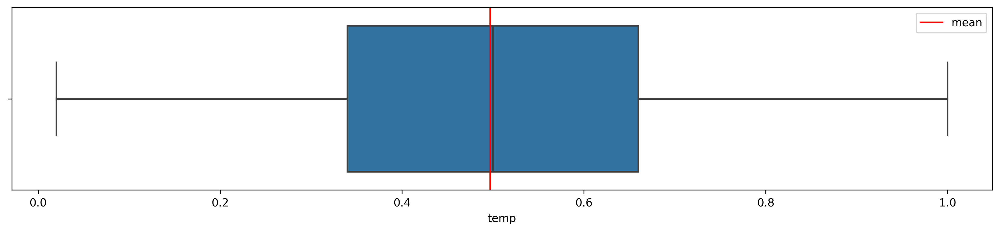

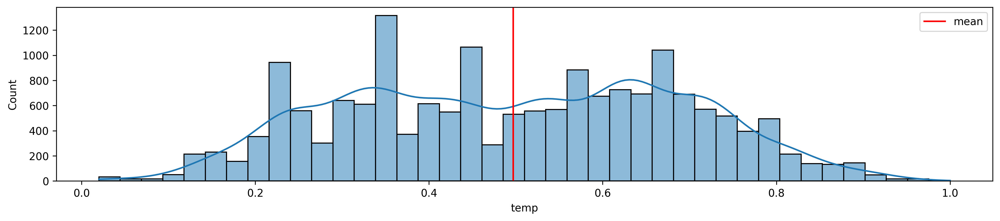

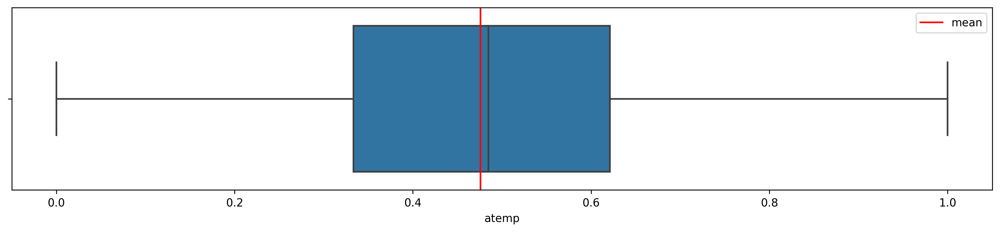

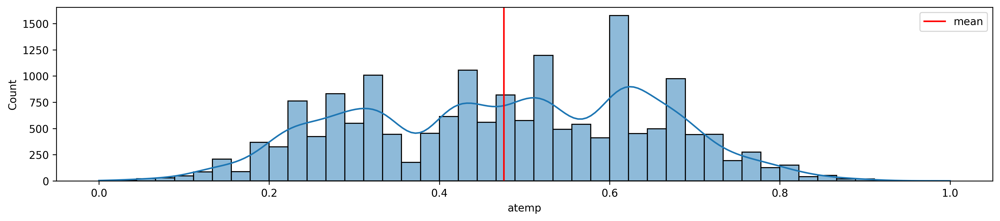

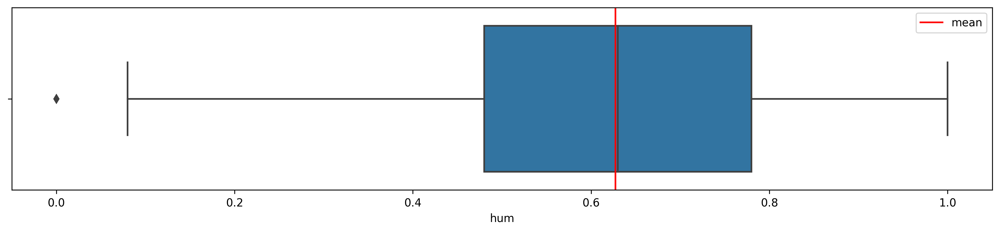

...

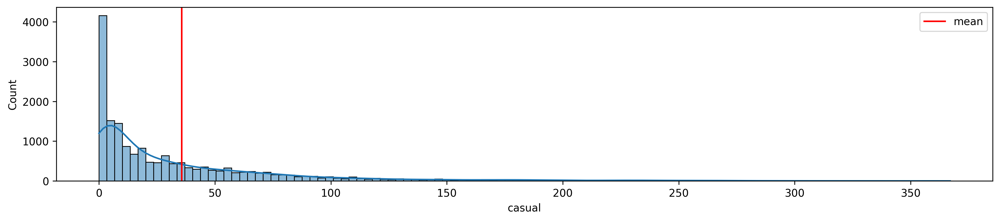

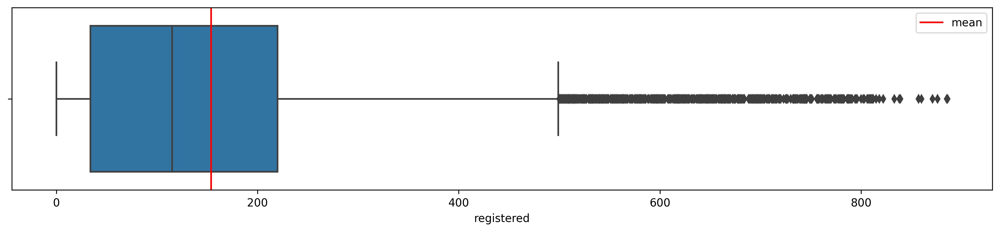

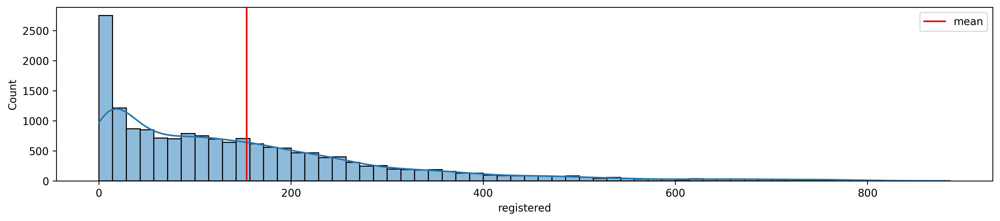

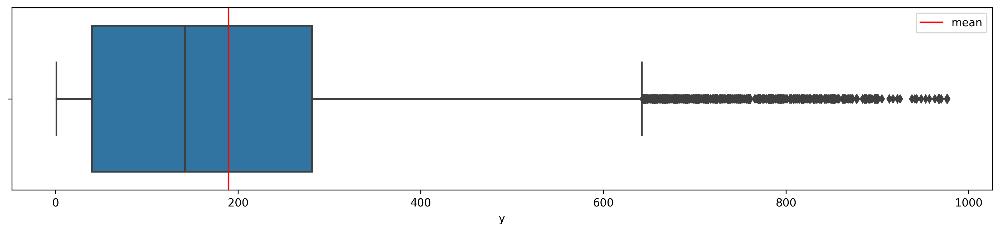

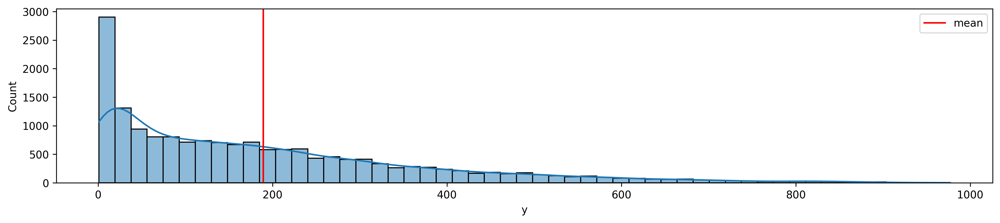

In [18]:
for c in col_num:

    # viz for boxplot
    adjust(h=3)
    sns.boxplot(x=hour[c])
    plt.axvline(x=hour[c].mean(), c='r', label='mean')
    plt.legend()
    plt.show()

    # viz for histplot
    adjust(h=3)    
    sns.histplot(hour[c], kde=True)
    plt.axvline(x=hour[c].mean(), c='r', label='mean')
    plt.legend()
    plt.show()

In [19]:
for c in cols:
    stat, p = stats.shapiro(hour[c])
    if p > 0.05: # accept h0
        print(f"{c} probably gaussian")
    else:
        print(f"{c} probably not gaussian")

temp probably not gaussian
atemp probably not gaussian
hum probably not gaussian
windspeed probably not gaussian
casual probably not gaussian
registered probably not gaussian
y probably not gaussian


c:\Users\yandiher\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\stats\_morestats.py:1816: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


findings:
- temp, atemp, hum, and windspeed look the mean and median are close each other.
- all interger variable are not normally distributed.
- casual, registered, and y are right skew. the outlier pulls the mean and far from the median. this outliers will affect all statistical methods that using standard deviation.

#### categorical

In [20]:
categorical = hour[col_cat].describe()
categorical = categorical.T
categorical['percent_top'] = (categorical['freq']/categorical['count']).round(3)
categorical = categorical.T
categorical

,season,year,month,hour,holiday,weekday,workingday,weathersit
count,17379.000,17379.000,17379.000,17379.000,17379.000,17379.000,17379.000,17379.000
unique,4.000,2.000,12.000,24.000,2.000,7.000,2.000,4.000
top,3.000,1.000,5.000,17.000,0.000,6.000,1.000,1.000
freq,4496.000,8734.000,1488.000,730.000,16879.000,2512.000,11865.000,11413.000
percent_top,0.259,0.503,0.086,0.042,0.971,0.145,0.683,0.657


from here, we can see what happened in y.

the best dimension for this dataset is x=hour that contains 0-24 hours, y=y that contains the count of users, and the hue is other categorical variables.

we can split the y into casual and registered.

In [21]:
# statements
x = hour['hour']
y = hour['y']
casual = hour['casual']
registered = hour['registered']

In [22]:
def viz(target, hue, title):
    adjust(h=6)
    sns.pointplot(x=x, y=target, hue=hue)
    plt.title(title)
    plt.show()

I use hue parameter in seaborn to group variables and y as sum function instead of using pd.pivot_table()

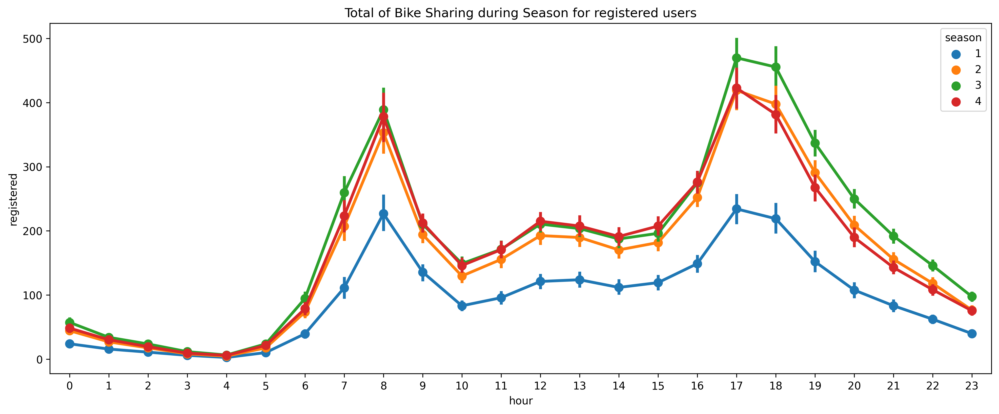

In [23]:
viz(registered, hour['season'], 'Total of Bike Sharing during Season for registered users')

findings:

- every season shows that at 5, trends are increasing until 8 and decreasing after that to 10. usually that range of time is a regular time when people are going to work or going to school.
- simultaneously, at 15 every season, the demand of bike sharing is increasing until 17 and then decreasing gradually untul 23.
- this means the demands of bike sharing is high when people are going to the office or school because 8 am is normally the time when people are going to work or study and 17 pm is normally the time when people go back home from their activities.

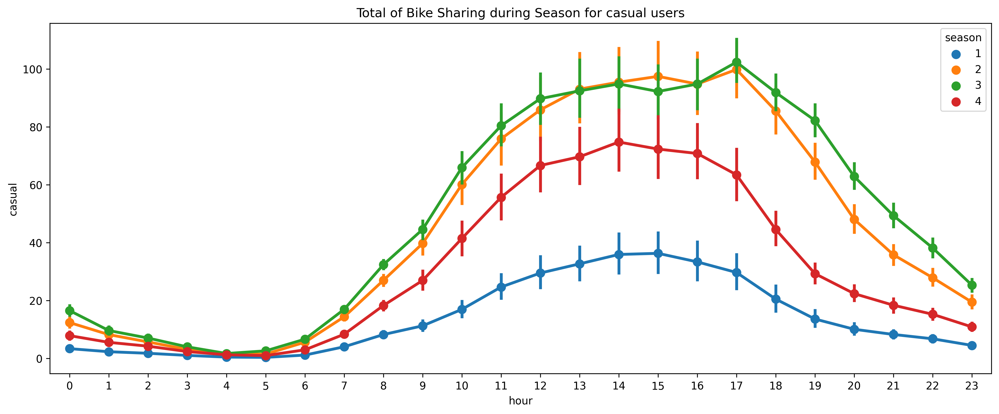

In [24]:
viz(casual, hour['season'], 'Total of Bike Sharing during Season for casual users')

findings:
- if we compare to registered users, casual users make pattern like 1 time sinewave.
- every season still has the same pattern. the distinguish in every season is the total number of bike users.
- diferent form registered user behaviour, the behaviour of casual users to use bike sharing is high when registered users do not use bike sharing. my personal assumption is casual users use bike sharing in holiday or something similar.

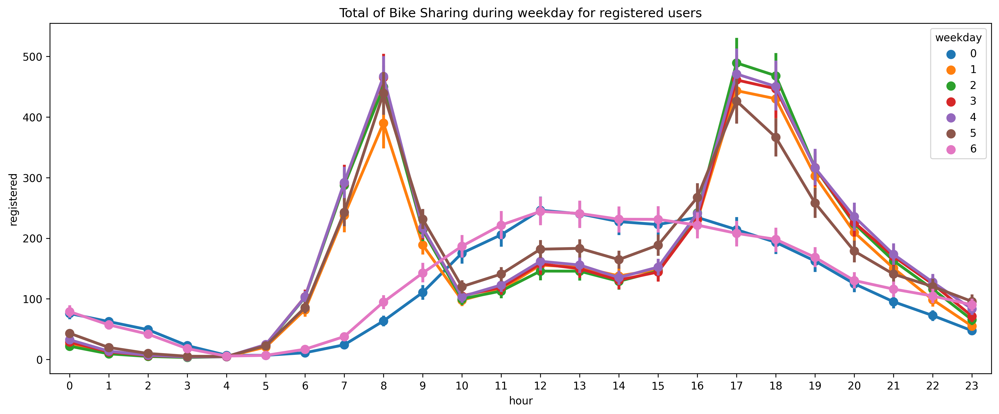

In [25]:
viz(registered, hour['weekday'], 'Total of Bike Sharing during weekday for registered users')

findings:
- the pattern for registered users everyday almost looks similar from the pattern every season.
- there is two different lines. line 0 and 6. if we see from the note, it is written that 0 and 6 represent saturday and sunday. no wonder the use of bike sharing is higher on weekends at working hours. registered users use bike sharing more at working hours on weekends.

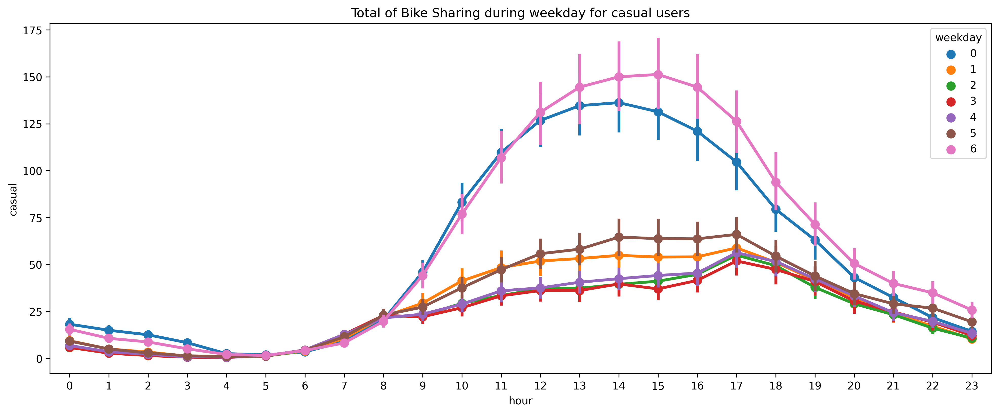

In [26]:
viz(casual, hour['weekday'], 'Total of Bike Sharing during weekday for casual users')

findings:
- at working hours, more casual users use bike sharing on weekends.

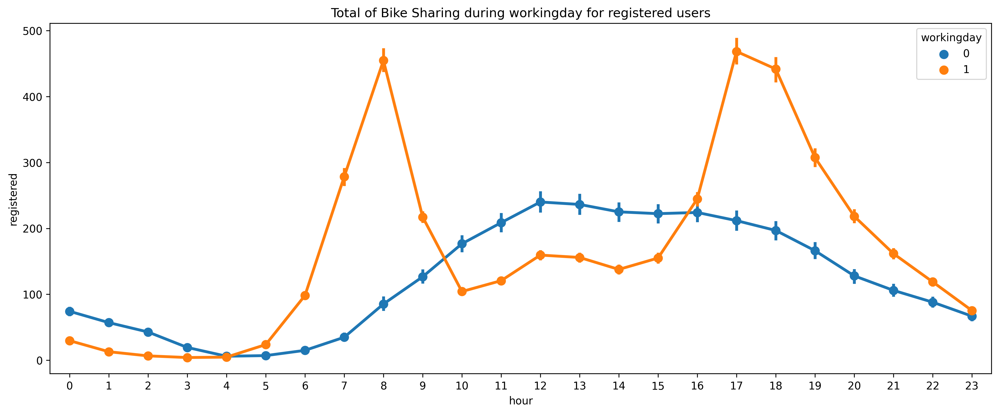

In [27]:
viz(registered, hour['workingday'], 'Total of Bike Sharing during workingday for registered users')

findings:
- for registered users, time for going to work or school and time for going back home are high demand only on workingday.
- the demand is high on working hours when it is not working day.

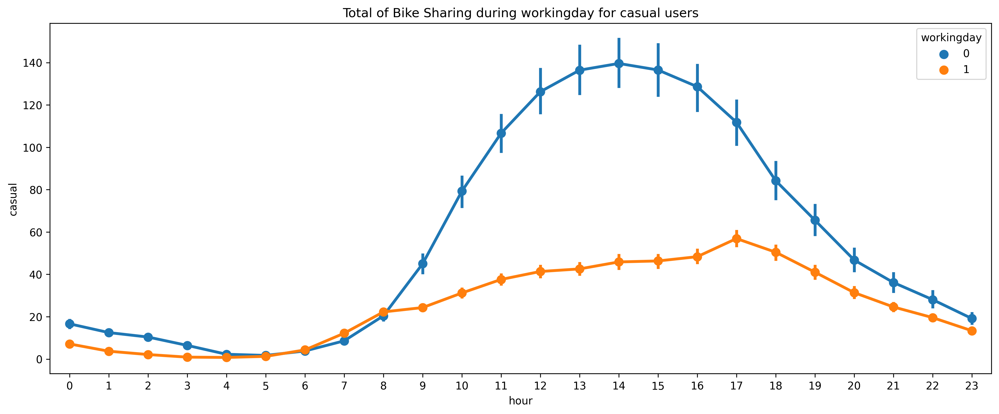

In [28]:
viz(casual, hour['workingday'], 'Total of Bike Sharing during workingday for casual users')

findings:
- casual users use more bike sharing at working hours when it is not working day.

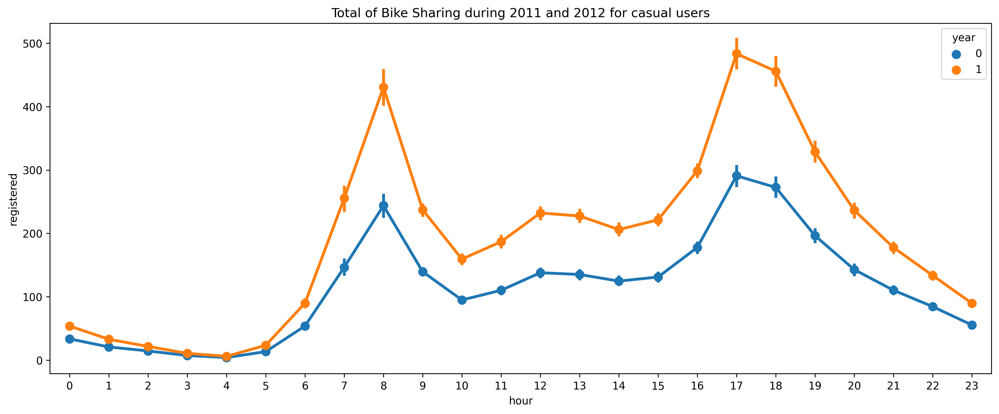

In [29]:
viz(registered, hour['year'], 'Total of Bike Sharing during 2011 and 2012 for casual users')

findings:
- although year 0 and year 1 have similar pattern for registered users, the demand in year 0 is less than year 1.

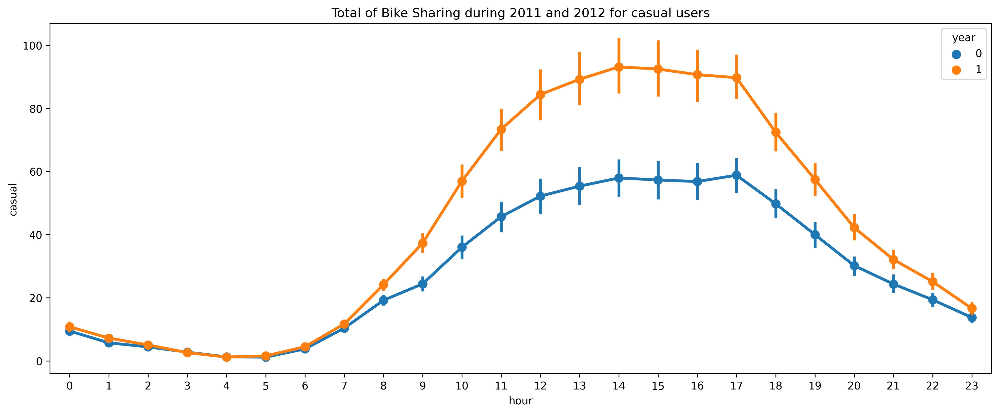

In [30]:
viz(casual, hour['year'], 'Total of Bike Sharing during 2011 and 2012 for casual users')

findings:
- the demand in year 0 is less than year 1

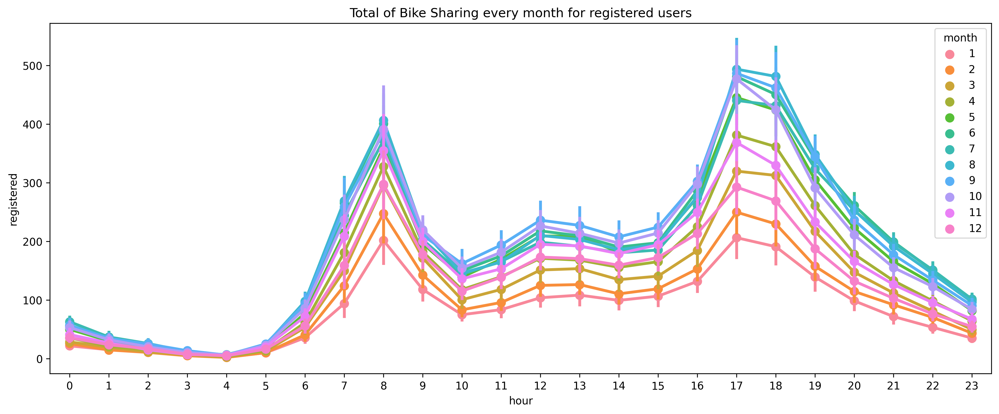

In [31]:
viz(registered, hour['month'], 'Total of Bike Sharing every month for registered users')

findings:
- nothing is really far from the pattern found before. need to figure out why the blue one is on the highest.

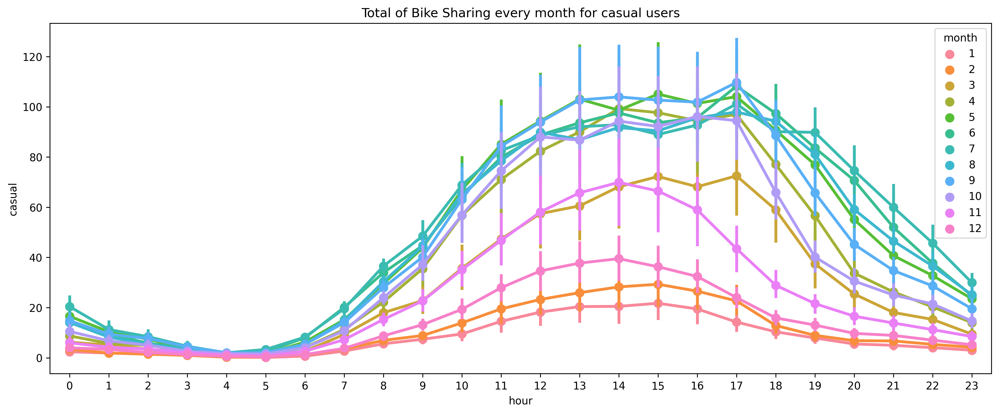

In [32]:
viz(casual, hour['month'], 'Total of Bike Sharing every month for casual users')

findings:
- nothing is really far from the pattern found before for casual users. need to figure out why the blue one is on the highest.

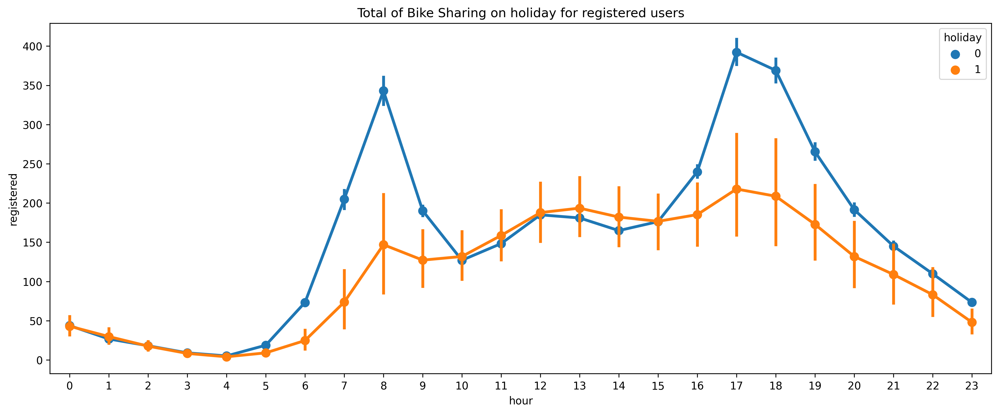

In [33]:
viz(registered, hour['holiday'], 'Total of Bike Sharing on holiday for registered users')

findings:
- the trend of registered users on looks high demand when it is not holiday

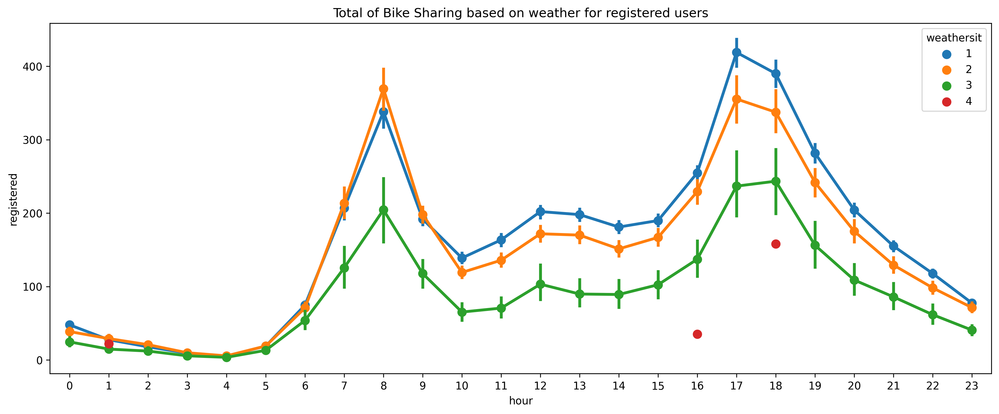

In [34]:
viz(registered, hour['weathersit'], 'Total of Bike Sharing based on weather for registered users')

findings:
- there are anomalies. 4 indicates heavy rain. only few people at spesific time use bike sharing when it is raining

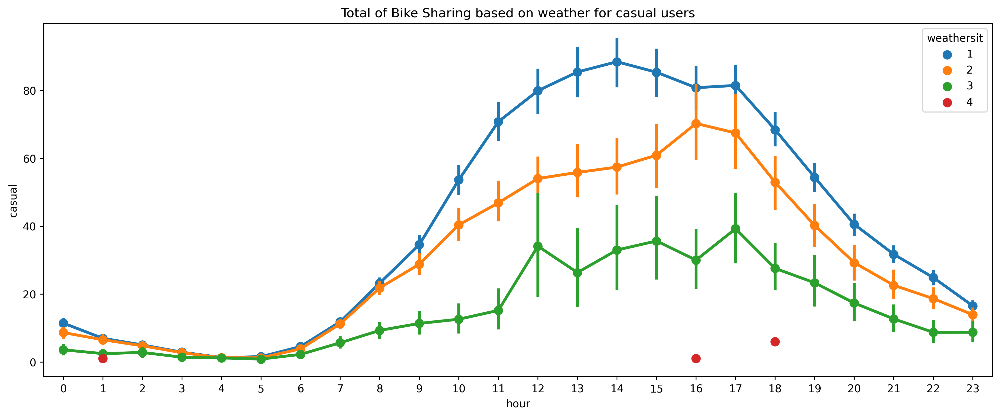

In [35]:
viz(casual, hour['weathersit'], 'Total of Bike Sharing based on weather for casual users')

findings:
- there are anomalies. 4 indicates heavy rain. only few people at spesific time use bike sharing when it is raining

C:\Users\yandiher\AppData\Local\Temp\ipykernel_1188\2841791570.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = hour.corr().round(3)


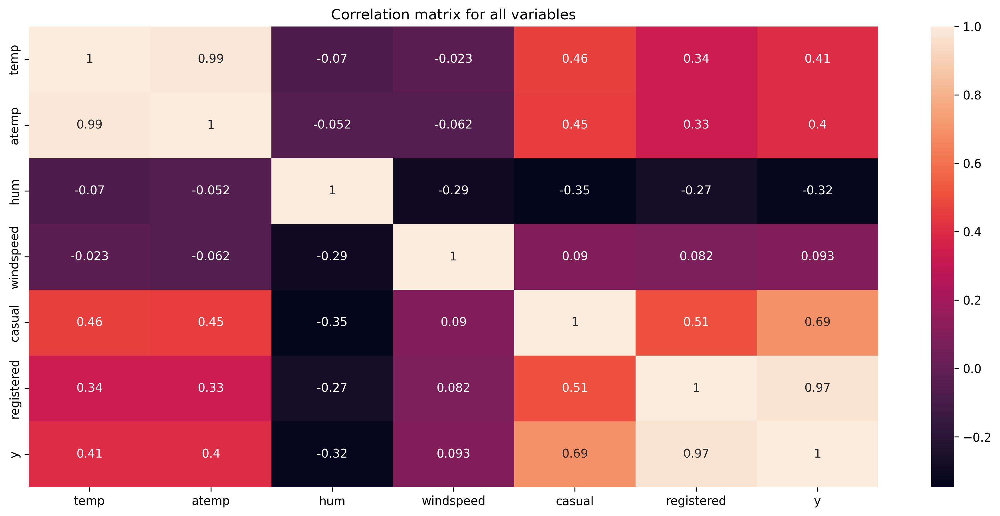

In [36]:
corr = hour.corr().round(3)

adjust(h=7)
sns.heatmap(corr, annot=True)
plt.title('Correlation matrix for all variables')
plt.show()

findings:
- month and season are correlated each other with value 83%. it means month can 83% explain season or vice versa.
- temp and atemp are almost prefectly correlated. obviously one of them is not necessary to be the predictors.
- registered and casual variables are correlated to y because y is the sum of registered and casual users.

In [54]:
y_label = ['registered', 'casual', 'y']

for y in y_label:
    print(y)
    print(hour[['temp', 'hum', 'windspeed']].corrwith(hour[y]))

registered
temp         0.335361
hum         -0.273933
windspeed    0.082321
dtype: float64
casual
temp         0.459616
hum         -0.347028
windspeed    0.090287
dtype: float64
y
temp         0.404772
hum         -0.322911
windspeed    0.093234
dtype: float64


findings:
- it is interesting to see the variable workingday where it has positive correlation with registered users and negative correlation with casual users.

In [38]:
# drop month and atemp
hour = hour.drop(['month', 'atemp'], axis=1)
hour.tail()

,season,year,hour,holiday,weekday,workingday,weathersit,temp,hum,windspeed,casual,registered,y
17374,1,1,19,0,1,1,2,0.26,0.60,0.1642,11,108,119
17375,1,1,20,0,1,1,2,0.26,0.60,0.1642,8,81,89
17376,1,1,21,0,1,1,1,0.26,0.60,0.1642,7,83,90
17377,1,1,22,0,1,1,1,0.26,0.56,0.1343,13,48,61
17378,1,1,23,0,1,1,1,0.26,0.65,0.1343,12,37,49


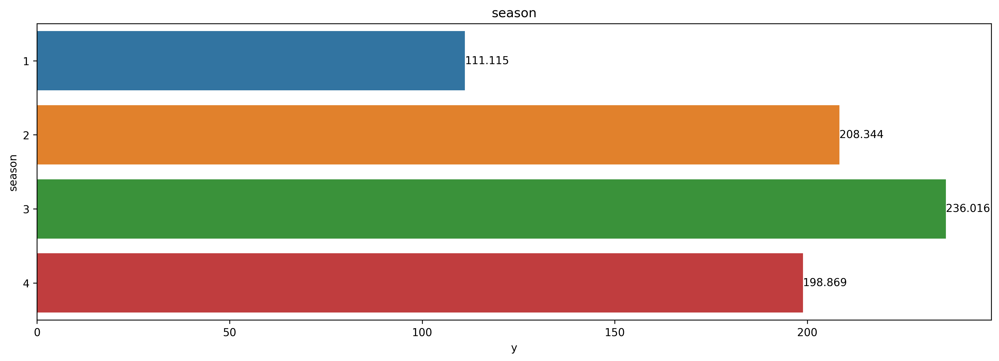

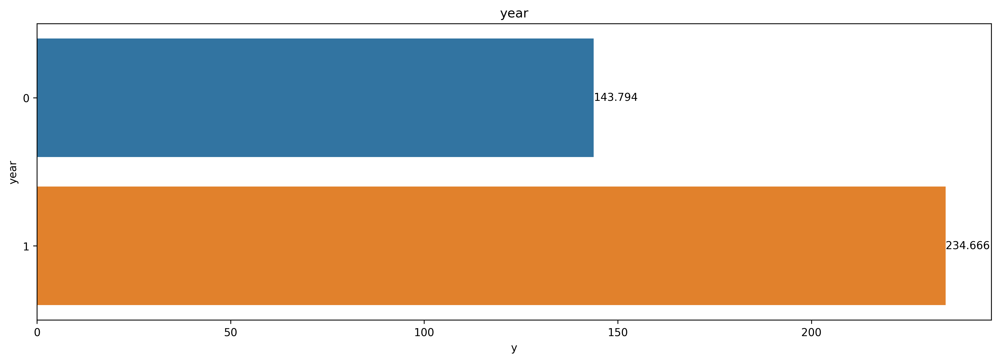

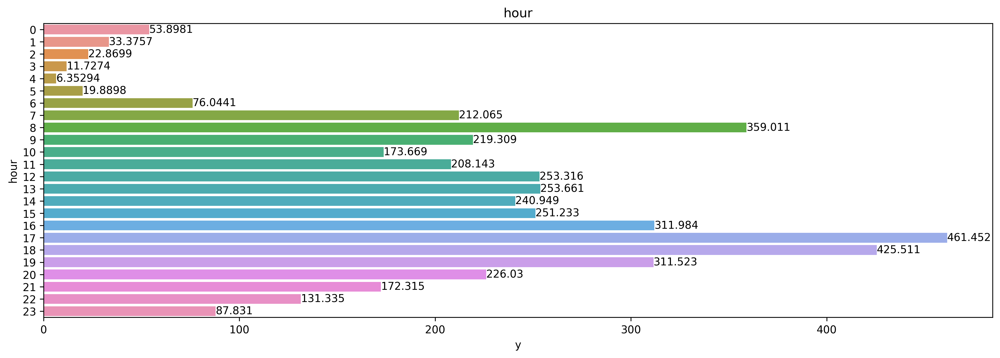

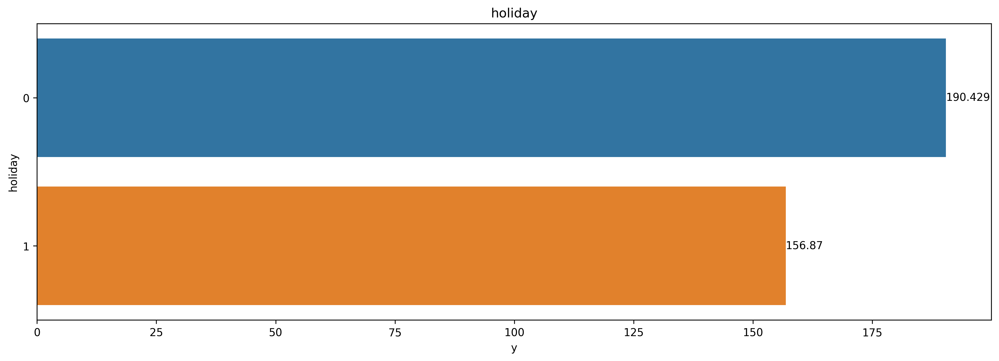

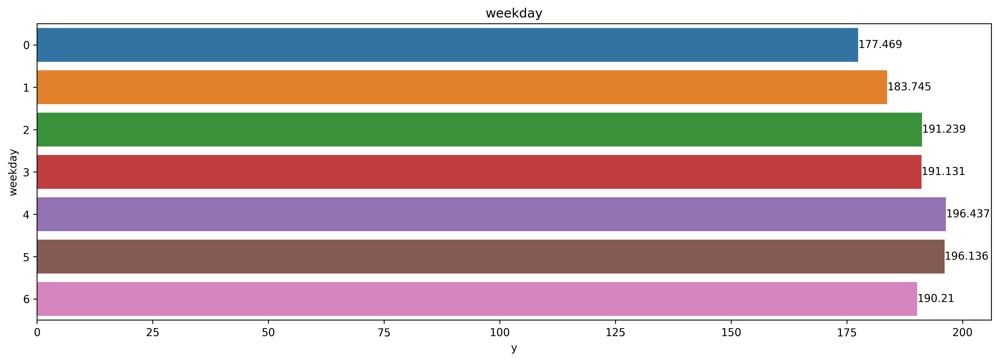

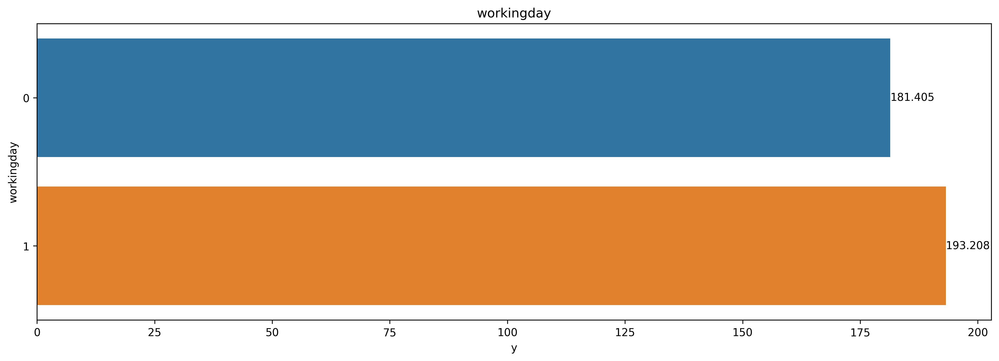

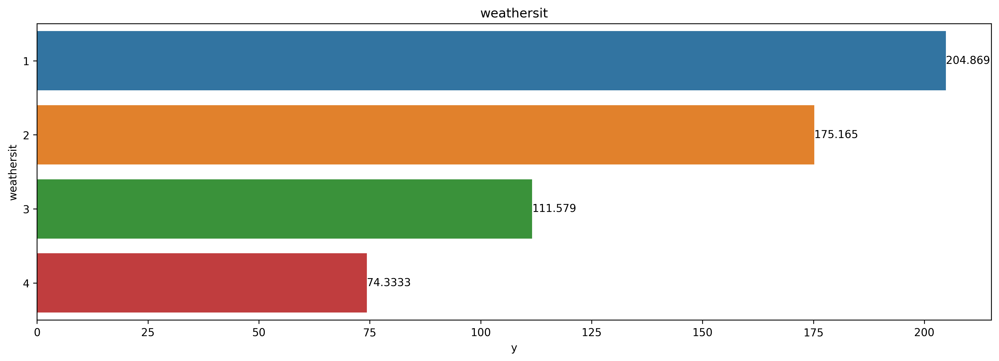

In [39]:
col_cat = hour.keys()[:7]

for c in col_cat:
    adjust()
    ax = sns.barplot(data=hour, x=y, y=c, errorbar=('ci', False))
    ax.bar_label(ax.containers[0])
    plt.title(c)
    plt.show()

findings:
- from weathersit, the highest demand is when the weather situation is clear, few clouds, and partly cloudy.
- from working day, there is no big different between  it is working day or holiday.
- from week, the highest demand is is thrusday and friday, but the different is not quite far from others.
- bike sharing demand is higher when it is not holiday, compared to holiday.
- there is also a big different between year 2011 and 2012 where demand of bike sharing in 2012 is higher.
- the lowest demand of bike sharing is in springer.
- hour variable shows that at the demand is increasing at 8, 17 and 18.

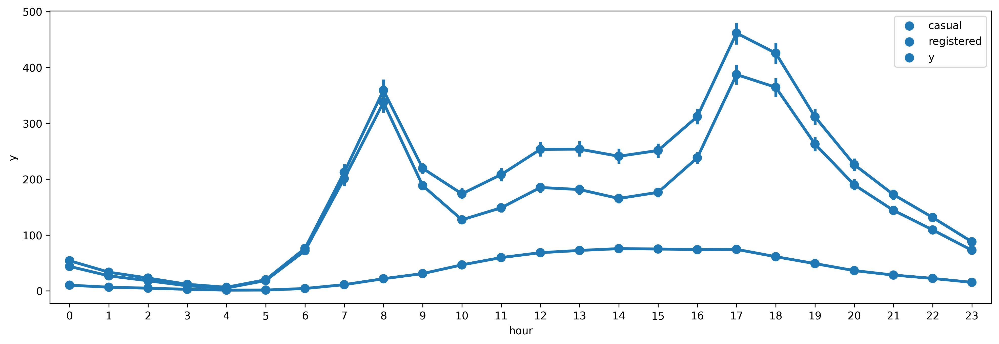

In [40]:
adjust()
sns.pointplot(x=hour['hour'], y=hour['casual'], label='casual')
sns.pointplot(x=hour['hour'], y=hour['registered'], label='registered')
sns.pointplot(x=hour['hour'], y=hour['y'], label='y')
plt.legend()
plt.show()

findings:
- the demand from casual users is higher at working hours.
- overall the demand of bike sharing is extremely increasing when people go to work or school and when people go back home.

In [41]:
# day.to_csv('day_clean.csv')
# hour.to_csv('hour_clean.csv')

## Visualization & Explanatory Analysis

### Pertanyaan 1:

kapan kebanyakan user menggunakan user bike sharing?

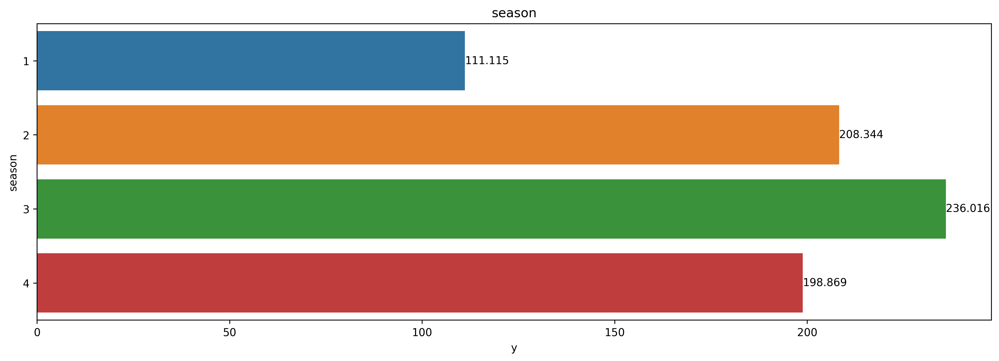

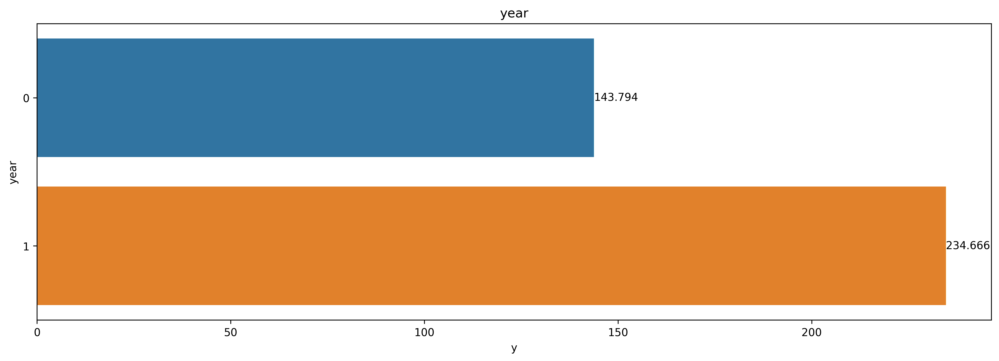

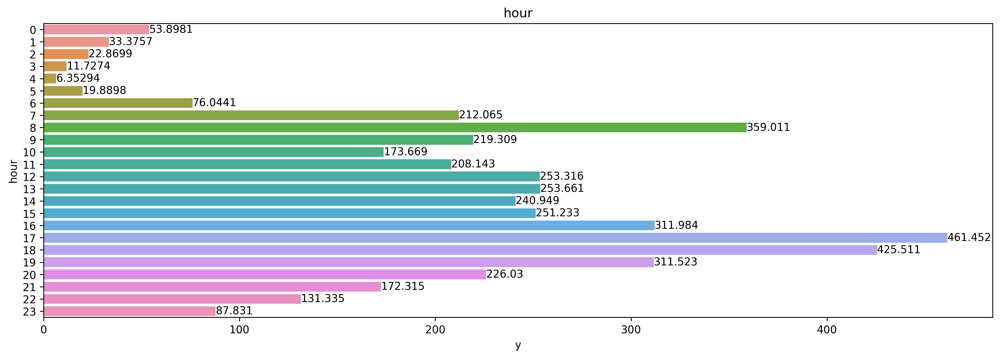

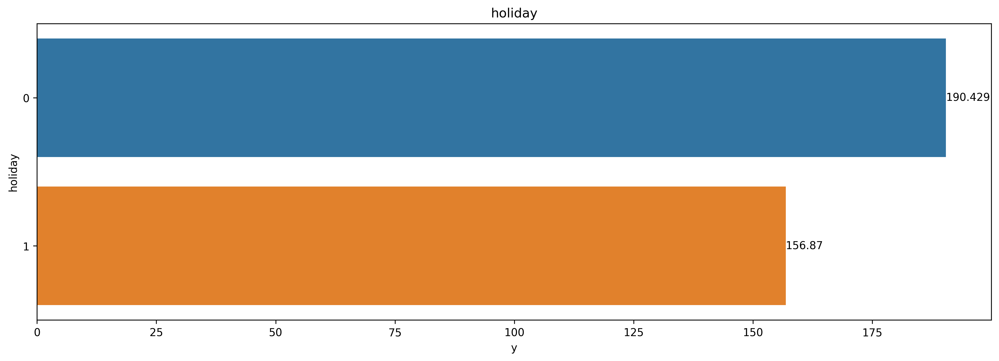

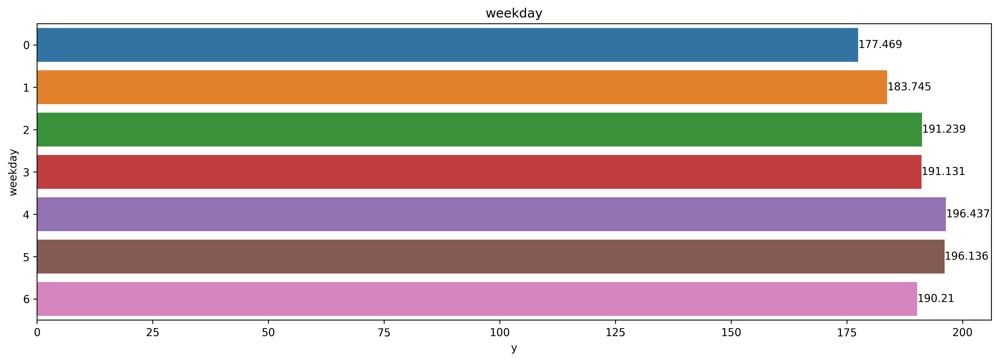

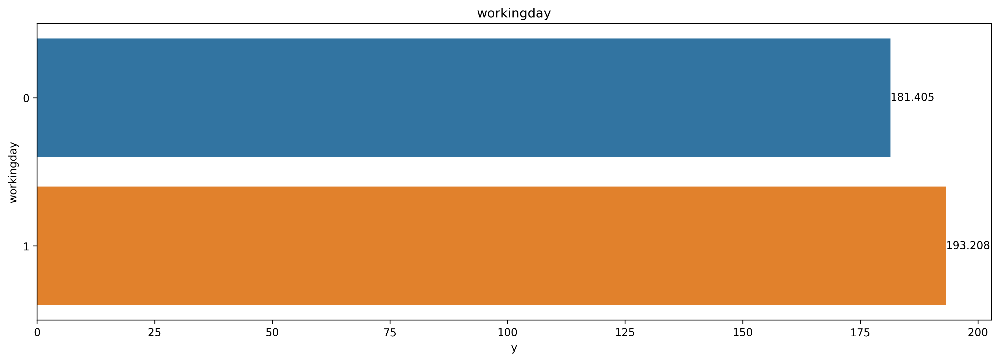

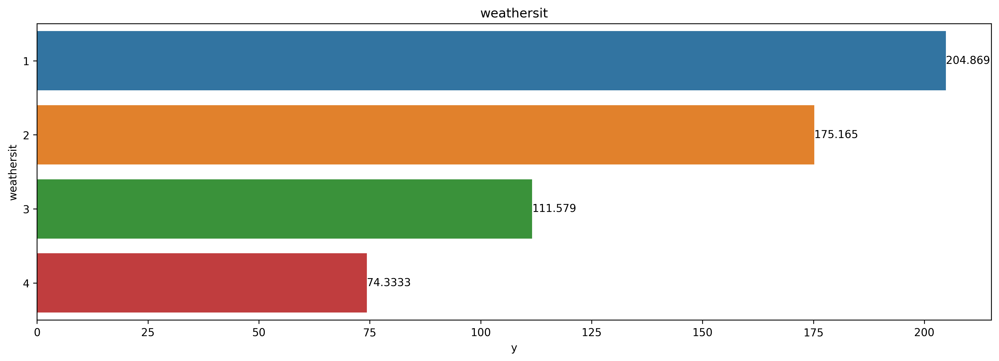

In [42]:
col_cat = hour.keys()[:7]

for c in col_cat:
    adjust()
    ax = sns.barplot(data=hour, x=y, y=c, errorbar=('ci', False))
    ax.bar_label(ax.containers[0])
    plt.title(c)
    plt.show()

findings:
- from weathersit, the highest demand is when the weather situation is clear, few clouds, and partly cloudy.
- from working day, there is no big different between  it is working day or holiday.
- from week, the highest demand is is thrusday and friday, but the different is not quite far from others.
- bike sharing demand is higher when it is not holiday, compared to holiday.
- there is also a big different between year 2011 and 2012 where demand of bike sharing in 2012 is higher.
- the lowest demand of bike sharing is in springer.
- hour variable shows that at the demand is increasing at 8, 17 and 18.

### Pertanyaan 2:

faktor apa saja yang meningkatkan penggunaan bike sharing?

In [56]:
for y in y_label:
    print(y)
    print(hour[['temp', 'hum', 'windspeed']].corrwith(hour[y]))

registered
temp         0.335361
hum         -0.273933
windspeed    0.082321
dtype: float64
casual
temp         0.459616
hum         -0.347028
windspeed    0.090287
dtype: float64
y
temp         0.404772
hum         -0.322911
windspeed    0.093234
dtype: float64


findings:
- overall temp and is the highest value for positive correlation and hum is the higest value for negative correlation to demand of bike sharing for numeric variables.

# Conclusion

- Conclution pertanyaan 1: overall the demand of bike sharing is extremely increasing when people go to work or school and when people go back home.
- conclution pertanyaan 2: overall for categorical variables, hour is the highest value correlated to demand of bike sharing and temp is the highest value correlated to demand of bike sharing for numeric variables.